In [1]:
%reset -f
import os
path_input = '.'
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
from scipy.special import logsumexp
# !pip install ./einops-0.8.0-py3-none-any.whl

train_essays 标签分布:
generated
0    1375
1       3
Name: count, dtype: int64

daigt_v2 标签分布:
generated
0    27371
1    17497
Name: count, dtype: int64


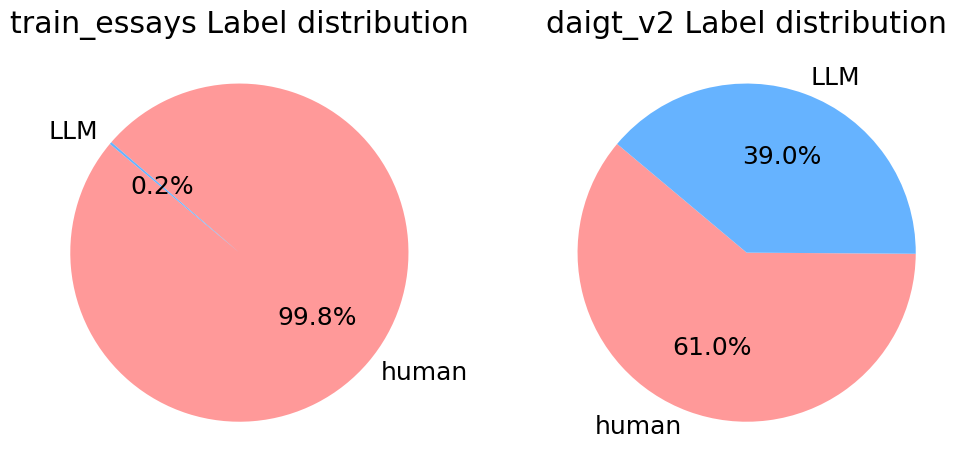

In [2]:
import matplotlib.pyplot as plt
import pandas as pd

tab_train = pd.read_csv(f'{path_input}/llm-detect-ai-generated-text/train_essays.csv')
tab_train['set'] = 'train'

tab_daigt = pd.read_csv(f'{path_input}/daigt-v2-train-dataset/train_v2_drcat_02.csv')
tab_daigt.rename(columns = {"label":"generated"}, inplace=True)
tab_daigt['set'] = 'daigt'

# 计算标签分布
train_counts = tab_train['generated'].value_counts()
daigt_counts = tab_daigt['generated'].value_counts()

print("train_essays 标签分布:")
print(train_counts)
print("\ndaigt_v2 标签分布:")
print(daigt_counts)

# 标签映射
labels = {0: 'human', 1: 'LLM'}

# 设置字体大小
plt.rcParams.update({'font.size': 18})

# 设置颜色
colors = ['#ff9999','#66b3ff']

# 绘制 tab_train 的饼状图
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.pie(train_counts, labels=[labels[i] for i in train_counts.index], autopct='%1.1f%%', startangle=140, colors=colors)
plt.title('train_essays Label distribution')

# 绘制 tab_daigt 的饼状图
plt.subplot(1, 2, 2)
plt.pie(daigt_counts, labels=[labels[i] for i in daigt_counts.index], autopct='%1.1f%%', startangle=140, colors=colors)
plt.title('daigt_v2 Label distribution')

plt.show()

train_set Label distribution:
generated
0    1375
1       3
Name: count, dtype: int64

valid_set Label distribution:
generated
0    1660
1    1096
Name: count, dtype: int64


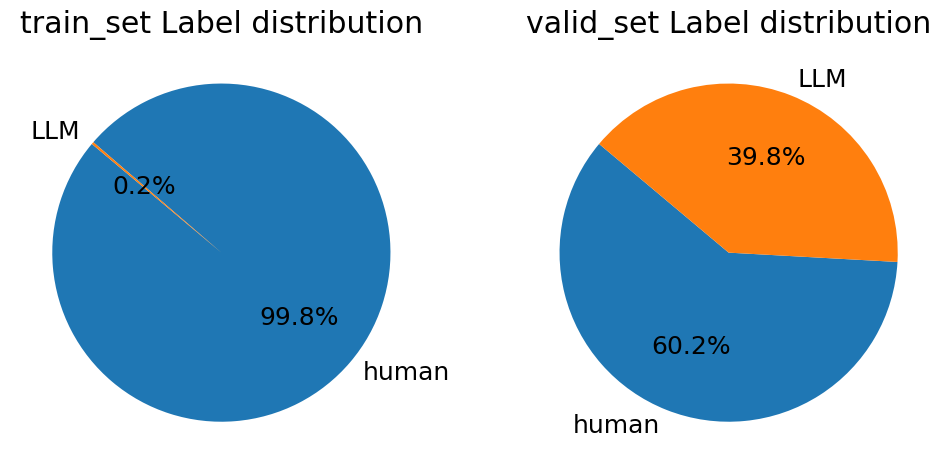

In [3]:
from sklearn.model_selection import train_test_split

# 从 tab_daigt 中抽样
sampled_daigt = tab_daigt.sample(n=int(2*len(tab_train)), random_state=42)

# 合并数据集
# combined_data = pd.concat([tab_train, sampled_daigt]).reset_index(drop=True)

# 取出 tab_train 中 generated 为 1 的部分
#tab_train_generated_1 = tab_train[tab_train['generated'] == 1]

# 分割数据集
train_data, val_data = train_test_split(tab_train, test_size=0.3, random_state=63)

train_data=tab_train
val_data=sampled_daigt

# 计算标签分布
train_counts = train_data['generated'].value_counts()
val_counts = val_data['generated'].value_counts()

# 打印标签分布
print("train_set Label distribution:") 
print(train_counts)
print("\nvalid_set Label distribution:")
print(val_counts)

# 标签映射
labels = {0: 'human', 1: 'LLM'}

# 绘制训练集的饼状图
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.pie(train_counts, labels=[labels[i] for i in train_counts.index], autopct='%1.1f%%', startangle=140)
plt.title('train_set Label distribution')

# 绘制验证集的饼状图
plt.subplot(1, 2, 2)
plt.pie(val_counts, labels=[labels[i] for i in val_counts.index], autopct='%1.1f%%', startangle=140)
plt.title('valid_set Label distribution')

plt.show()

In [4]:
import torch
import tqdm
device = "cuda:0" if torch.cuda.is_available() else "cpu"
dtype = torch.float16 if torch.cuda.is_available() else torch.float32
print(device, dtype, flush=True)

cuda:0 torch.float16


In [5]:
from transformers import AutoTokenizer, AutoModelForCausalLM
print(device, dtype, flush=True)

dict_llm = {
   #'gpt2' : ('/kaggle/input/save-models/models/gpt2-xl', GPT2LMHeadModel, 1024, dict()),
   #'opt'  : ("/kaggle/input/save-models/models/facebook/opt-2.7b", OPTForCausalLM, 2048, dict()),
   #'bert' : ("/kaggle/input/save-models/models/bert-base-uncased", BertLMHeadModel, 512, {'is_decoder':True}),
   #'phi3.5' : (f'{path_input}/models/Phi-3.5-mini-instruct', AutoModelForCausalLM, 2048,  dict()),
   'Qwen2.5': (f'{path_input}/models/Qwen2.5-3B-Instruct', AutoModelForCausalLM, 2048,  dict()),
}

llm_tokenizer = dict()
llm_model = dict()
for _ in dict_llm:
    llm_tokenizer[_] = AutoTokenizer.from_pretrained(dict_llm[_][0], add_bos_token = True)
    if llm_tokenizer[_].pad_token is None:
        llm_tokenizer[_].pad_token = llm_tokenizer[_].eos_token
    llm_model[_] = dict_llm[_][1].from_pretrained(dict_llm[_][0], torch_dtype=dtype, device_map=device, **dict_llm[_][3])
    print(_, flush=True)

print('done', flush=True)

cuda:0 torch.float16


Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

Qwen2.5
done


In [6]:
def compute_entropy(input_ids, logits, attention_mask, token_type_ids=None):
    with torch.no_grad():
        logits = torch.log_softmax(logits.float(), dim=-1)
        # scores S, W ,P
        tokens = input_ids[:, 1:]
        attention_mask = attention_mask[:, 1:]
        
        entD = torch.sum(logits * torch.exp(logits), dim=-1)[:, 1:]
        entL = torch.gather(logits[:, :-1, :], dim=-1, index = tokens[:,:,None])[:,:,0]
        
        entD = -torch.where(attention_mask!=0, entD, np.nan)
        entL = -torch.where(attention_mask!=0, entL, np.nan)
        
    return entD, entL


def generate_logprob(llm_model, llm_tokenizer, prompt, max_length=None, add_special_tokens = True, padding=False):
    with torch.no_grad():
        device = next(llm_model.parameters()).device
        tokens = llm_tokenizer(prompt, return_tensors="pt",
                               max_length=max_length, truncation=max_length is not None, truncation_strategy = 'longest_first', add_special_tokens=add_special_tokens, padding=padding)
        tokens = {_: tokens[_].to(device) for _ in tokens}
        logits = llm_model(**tokens).logits
        return compute_entropy(logits=logits, **tokens)


class Batch:
    def __init__(self, iterable, size=1):
        self.iterable = iterable
        self.size = size
        self.len = len(range(0, len(self.iterable), self.size))
        
    def __iter__(self):
        l = len(self.iterable)
        n = self.size
        for ndx in range(0, l, n):
            yield self.iterable[ndx:min(ndx + n, l)]
    
    def __len__(self):
        return self.len

In [7]:
# from sklearn.svm import OneClassSVM

# feats_list = ['Dmed_Qwen2.5', 'Lmed_Qwen2.5', 'Dp05_Qwen2.5', 'Lstd_Qwen2.5', 'meanchr_Qwen2.5',]
# # feats_list = ['Dmed_phi3.5', 'Lmed_phi3.5', 'Dp05_phi3.5', 'Lstd_phi3.5', 'meanchr_phi3.5',]
# classifier = OneClassSVM(verbose=1,  kernel='rbf', gamma='auto',nu=0.05);

list_op = {
    'len':  lambda a, axis: np.sum(np.isfinite(a),axis),
    'med': np.nanmedian,
    'max': np.nanmax,
    'mean': np.nanmean,
    'std': np.nanstd,
    'p05' : lambda a, axis: np.nanpercentile(a, 5,axis=axis),
    'p80' : lambda a, axis: np.nanpercentile(a,80,axis=axis),
    'p90' : lambda a, axis: np.nanpercentile(a,90,axis=axis),
    'p95' : lambda a, axis: np.nanpercentile(a,95,axis=axis),
    'p98' : lambda a, axis: np.nanpercentile(a,98,axis=axis),
    #'lse': logsumexp,
}

In [8]:
batch_size = 3
print(batch_size)
#for _ in dict_llm:
#    print(_, flush=True)
#    texts = [' '.join(['hello',]*dict_llm[_][2]) for i in range(batch_size)]
#    vet = generate_logprob(llm_model[_], llm_tokenizer[_], texts, max_length=dict_llm[_][2], padding=True).cpu().numpy()
#print('done', flush=True)

3


In [9]:
def feature_extraction(tab, feats_list):
    for index in tqdm.tqdm(tab.index):
        text = tab.loc[index,'text']    
        tab.loc[index,'len_chr'] = len(text)
    for _ in dict_llm:
        print(_, flush=True)
        for index_list in tqdm.tqdm(Batch(tab.index, batch_size)):
            texts = [tab.loc[index,'text'] for index in index_list]
            vetD, vetL = generate_logprob(llm_model[_], llm_tokenizer[_], texts, max_length=dict_llm[_][2], padding=True)
            vetD = vetD.cpu().numpy()
            vetL = vetL.cpu().numpy()
            # torch.cuda.empty_cache()
            
            tab.loc[index_list,'meanchr_'+_] = tab.loc[index_list,'len_chr'].values / np.sum(np.isfinite(vetL),-1)
            
            for op in list_op:
                keyD = 'D'+op+'_'+_
                if keyD in feats_list:
                    op_vet = list_op[op](vetD, axis=-1)
                    for index, value in zip(index_list, op_vet):
                        tab.loc[index, keyD] = value
                        
                keyL = 'L'+op+'_'+_
                if keyL in feats_list:
                    op_vet = list_op[op](vetL, axis=-1)
                    for index, value in zip(index_list, op_vet):
                        tab.loc[index, keyL] = value
    return tab

In [10]:
# 此部分用于HPO
import optuna
import numpy as np
from sklearn.svm import OneClassSVM
from sklearn.metrics import roc_auc_score
import pandas as pd

# 首先提取所有可能的特征
def get_all_possible_features():
    prefixes = ['D', 'L']
    operations = ['med', 'max', 'mean', 'std', 'p05', 'p80', 'p90', 'p95', 'p98']
    models = ['Qwen2.5']
    
    all_features = []
    # 添加所有基础特征
    for prefix in prefixes:
        for op in operations:
            for model in models:
                all_features.append(f'{prefix}{op}_{model}')
    # 添加 meanchr 特征
    for model in models:
        all_features.append(f'meanchr_{model}')
    
    return all_features

def objective(trial, train_data_processed, val_data_processed, all_possible_features):
    # 为每个特征决定是否使用
    selected_features = []
    for feature in all_possible_features:
        if trial.suggest_categorical(feature, [True, False]):
            selected_features.append(feature)
    
    # 确保至少选择了一个特征
    if len(selected_features) == 0:
        return 0.0
    
    # SVM 参数优化
    nu = trial.suggest_float('nu', 0.01, 0.2)
    gamma = trial.suggest_categorical('gamma', ['scale', 'auto'])
    
    try:
        # 使用选定的特征训练模型
        classifier = OneClassSVM(kernel='rbf', gamma=gamma, nu=nu)
        
        # 获取训练数据
        train_feats = train_data_processed[train_data_processed['generated']==0][selected_features].values
        z_mean = np.mean(train_feats, 0, keepdims=True)
        z_std = np.maximum(np.std(train_feats, 0, keepdims=True), 1e-4)
        
        # 训练模型
        classifier.fit((train_feats - z_mean)/z_std)
        
        # 在验证集上评估
        test_feats = val_data_processed[selected_features].values
        predictions = -1.0 * classifier.decision_function((test_feats - z_mean) / z_std)
        score = roc_auc_score(val_data_processed['generated'], predictions)
        
        # 记录当前特征组合的结果
        # print(f"Trial {trial.number}:")
        # print(f"  Selected features: {len(selected_features)}")
        # print(f"  ROC-AUC: {score:.4f}")
        
        return score
    
    except Exception as e:
        print(f"Error occurred: {e}")
        return 0.0
    
# 获取所有可能的特征
all_possible_features = get_all_possible_features()

# 准备数据（特征提取）
train_data_processed = feature_extraction(train_data, all_possible_features)
val_data_processed = feature_extraction(val_data, all_possible_features)

print('特征提取完成')

  0%|          | 0/1378 [00:00<?, ?it/s]

100%|██████████| 1378/1378 [00:00<00:00, 6352.02it/s]

Qwen2.5



100%|██████████| 2756/2756 [00:00<00:00, 6417.65it/s]

Qwen2.5



100%|██████████| 919/919 [05:13<00:00,  2.93it/s]

特征提取完成


In [13]:
# 创建学习实例
study = optuna.create_study(direction='maximize')

# 优化目标函数
study.optimize(lambda trial: objective(trial, train_data_processed, val_data_processed, all_possible_features), 
                n_trials=3000)

# 输出最佳结果
print("\nBest trial:")
trial = study.best_trial
print(f"  ROC-AUC: {trial.value:.4f}")
print("  Best features:")
selected_features = [key for key, value in trial.params.items() 
                    if value and not key in ['nu', 'gamma']]
for feature in selected_features:
    print(f"    - {feature}")
print(f"  Best nu: {trial.params['nu']:.4f}")
print(f"  Best gamma: {trial.params['gamma']}")

# 保存最佳特征组合
with open('best_features.txt', 'w') as f:
    f.write('\n'.join(selected_features))

[I 2024-12-06 16:00:28,499] A new study created in memory with name: no-name-a9624916-715c-4d67-9b37-3b161b529e87
[I 2024-12-06 16:00:28,583] Trial 0 finished with value: 0.9513054040981445 and parameters: {'Dmed_Qwen2.5': True, 'Dmax_Qwen2.5': True, 'Dmean_Qwen2.5': False, 'Dstd_Qwen2.5': False, 'Dp05_Qwen2.5': False, 'Dp80_Qwen2.5': True, 'Dp90_Qwen2.5': True, 'Dp95_Qwen2.5': True, 'Dp98_Qwen2.5': True, 'Lmed_Qwen2.5': False, 'Lmax_Qwen2.5': False, 'Lmean_Qwen2.5': True, 'Lstd_Qwen2.5': True, 'Lp05_Qwen2.5': False, 'Lp80_Qwen2.5': True, 'Lp90_Qwen2.5': False, 'Lp95_Qwen2.5': False, 'Lp98_Qwen2.5': False, 'meanchr_Qwen2.5': False, 'nu': 0.16920035745564876, 'gamma': 'scale'}. Best is trial 0 with value: 0.9513054040981445.
[I 2024-12-06 16:00:28,639] Trial 1 finished with value: 0.9422038519039662 and parameters: {'Dmed_Qwen2.5': True, 'Dmax_Qwen2.5': True, 'Dmean_Qwen2.5': True, 'Dstd_Qwen2.5': True, 'Dp05_Qwen2.5': False, 'Dp80_Qwen2.5': True, 'Dp90_Qwen2.5': True, 'Dp95_Qwen2.5': T


Best trial:
  ROC-AUC: 0.9831
  Best features:
    - Dmed_Qwen2.5
    - Dp95_Qwen2.5
    - Dp98_Qwen2.5
    - Lmax_Qwen2.5
    - Lp95_Qwen2.5
    - meanchr_Qwen2.5
  Best nu: 0.0703
  Best gamma: auto


In [14]:
# 可视化优化历史
fig1 = optuna.visualization.plot_optimization_history(study)
fig1.show()

# 可视化超参数重要性
fig2 = optuna.visualization.plot_param_importances(study)
fig2.show()

# 可视化超参数关系
fig3 = optuna.visualization.plot_parallel_coordinate(study)
fig3.show()

# 可视化超参数分布
fig4 = optuna.visualization.plot_slice(study)
fig4.show()
